In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import sys
sys.path.append('/tmp/local_scratch/v_neelesh_bisht/3d-cnn/')

import matplotlib.pyplot as plt
import numpy as np
import torch

from dataset import ImageDataset, MaskDataset
from models import CNN3D
from cams import CounterFactual, GradCam, DiffCAM
from utils import CommonUtils
from config import config

{'learning_rate': 0.0001, 'lr_decay_rate': 0.96, 'epochs': 100, 'batch_size': 4, 'img_size': 128, 'depth': 64, 'model_path': './models/archive/3d_cnn_scratch/3d_cnn_image_classification.pth'}


In [3]:
# get device for processing
device = CommonUtils.get_device(6)
print(f"Using device: {device}")

Using device: cuda:6


In [4]:
# get test data and mask data

output_dir = os.path.join(os.getcwd(), "MosMedData")
os.makedirs(output_dir, exist_ok=True)

test_scan_paths = [os.path.join(output_dir, "CT-1", x) for x in sorted(os.listdir(os.path.join(output_dir, "CT-1")))]
mask_scan_paths = [os.path.join(output_dir, "mask", x) for x in sorted(os.listdir(os.path.join(output_dir, "mask")))]

x_test = np.array([ImageDataset.process_image(path) for path in test_scan_paths])
y_test = np.array([1 for _ in range(len(test_scan_paths))])

print('Number of samples in test are %d' % (x_test.shape[0]))
test_sample = x_test[0] # width, height, depth
test_tensor = torch.tensor(test_sample).permute(2, 0, 1) # depth, width, height

masks = np.array([MaskDataset.process_mask(path) for path in mask_scan_paths])
mask_test_volume = masks[0]

Number of samples in test are 6


In [6]:
# Build model
model = CNN3D().to(device)
model.load_state_dict(torch.load(config['model_path']))
model.eval()

True


CNN3D(
  (conv1): Conv3DBlock(
    (conv3d): Conv3d(1, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (activation): ReLU()
    (pool): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (batchnorm): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): Conv3DBlock(
    (conv3d): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (activation): ReLU()
    (pool): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (batchnorm): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Conv3DBlock(
    (conv3d): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (activation): ReLU()
    (pool): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (batchnorm): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv4): Con

/shared/home/v_neelesh_bisht/local_scratch/cmu_research/lib/python3.10/site-packages/torch/nn/modules/module.py:1373: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


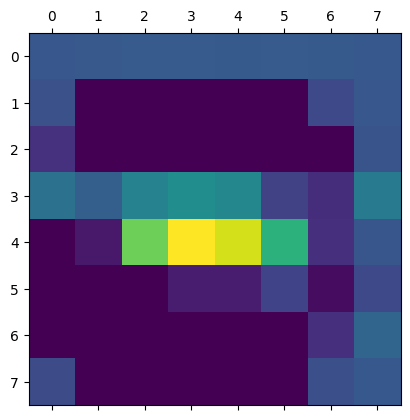

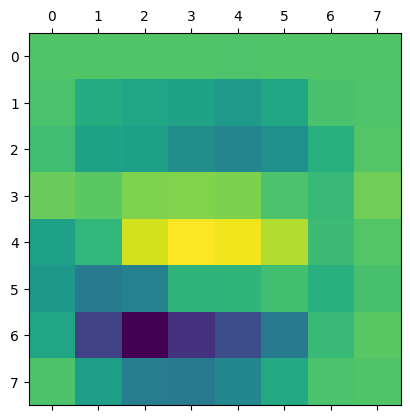

counter_factual, confidence_score :  0.6969562768936157
counter_factual, predicted_class :  1


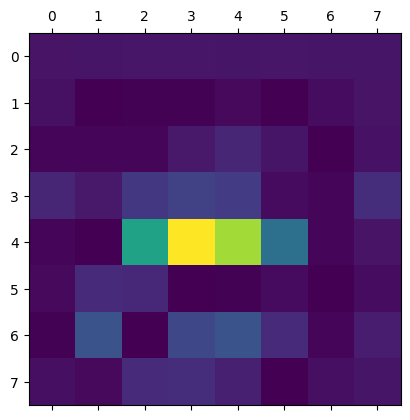

In [7]:
last_conv_layer_name = 'conv4'
sample = test_tensor.unsqueeze(0).unsqueeze(0).to(device, dtype=torch.float32)

target_class_idx = 1  # Target class
ref_class_idx = 0  # Reference class


# Generate grad and diff-grad class activation heatmap
grad_cam_heatmap, _,  diff_grad_cam_heatmap= GradCam.compute(sample, model, last_conv_layer_name, target_class_idx, ref_class_idx)
plt.matshow(np.squeeze(grad_cam_heatmap[:, :, 3]))
plt.show()


# Generate diff class activation heatmap
diff_cam_heatmap = DiffCAM.make_diffcam_heatmap(sample, model, target_class_idx, ref_class_idx)
plt.matshow(np.squeeze(diff_cam_heatmap[:, :, 3]))
plt.show()


# Generate counter factual heatmap
counter_factual_heatmap = CounterFactual.make_counter_factual_heatmap(sample, model, target_class_idx, ref_class_idx)
plt.matshow(np.squeeze(counter_factual_heatmap[:, :, 3]))
plt.show()


# Resize heatmap
grad_cam_heatmap = CommonUtils.get_resized_heatmap(grad_cam_heatmap, test_sample.shape)
diff_grad_cam_heatmap = CommonUtils.get_resized_heatmap(diff_grad_cam_heatmap, test_sample.shape)
diff_cam_heatmap = CommonUtils.get_resized_heatmap(diff_cam_heatmap, test_sample.shape)
counter_factual_heatmap = CommonUtils.get_resized_heatmap(counter_factual_heatmap, test_sample.shape)

In [8]:
#TODO move to MaskDataset normalization function
# Assuming mask values are 0 and 1, convert to yellow (1) and black (0)
mask_test = np.where(np.abs(mask_test_volume) < 1e-15, 0, 1)
 # Set non-1 values to NaN for transparency
mask_test = np.where(mask_test == 1, 1, np.nan) 

indices = np.where(mask_test == 1)
indices_list = list(zip(*indices))
arr = [i[2] for i in indices_list]

# Find the range of the slices
min_slice = np.min(np.unique(arr))
max_slice = np.max(np.unique(arr))

# Create a single figure with subplots
fig, ax = plt.subplots(max_slice - min_slice + 1, 6, figsize=(30, 5 * (max_slice - min_slice + 1)))

# Loop through each slice and plot the images in the appropriate subplot
for i in range(min_slice, max_slice + 1):
    slice_idx = i - min_slice

    # Adding titles for the first row
    if slice_idx == 0:
        ax[slice_idx, 0].set_title('Sample')
        ax[slice_idx, 1].set_title('Mask')
        ax[slice_idx, 2].set_title('Grad-CAM')
        ax[slice_idx, 3].set_title('Diff Grad-CAM')
        ax[slice_idx, 4].set_title('Diff-CAM')
        ax[slice_idx, 5].set_title('Counter Factual')

    ax[slice_idx, 0].imshow(np.squeeze(test_sample[:, :, i]), origin='upper', cmap='bone')
    ax[slice_idx, 1].imshow(np.squeeze(mask_test[:, :, i]), origin='upper', cmap='spring')

    img3 = ax[slice_idx, 2].imshow(np.squeeze(test_sample[:, :, i]), cmap='bone')
    img4 = ax[slice_idx, 2].imshow(np.squeeze(grad_cam_heatmap[:, :, i]), cmap='jet', alpha=0.5, extent=img3.get_extent())
    img5 = ax[slice_idx, 2].imshow(np.squeeze(mask_test[:, :, i]), cmap='spring', alpha=0.7, extent=img3.get_extent())

    img6 = ax[slice_idx, 3].imshow(np.squeeze(test_sample[:, :, i]), cmap='bone')
    img7 = ax[slice_idx, 3].imshow(np.squeeze(diff_grad_cam_heatmap[:, :, i]), cmap='jet', alpha=0.5, extent=img6.get_extent())
    img8 = ax[slice_idx, 3].imshow(np.squeeze(mask_test[:, :, i]), cmap='spring', alpha=0.7, extent=img6.get_extent())

    img9 = ax[slice_idx, 4].imshow(np.squeeze(test_sample[:, :, i]), cmap='bone')
    img10 = ax[slice_idx, 4].imshow(np.squeeze(diff_cam_heatmap[:, :, i]), cmap='jet', alpha=0.5, extent=img9.get_extent())
    img11 = ax[slice_idx, 4].imshow(np.squeeze(mask_test[:, :, i]), cmap='spring', alpha=0.7, extent=img9.get_extent())

    img12 = ax[slice_idx, 5].imshow(np.squeeze(test_sample[:, :, i]), cmap='bone')
    img13 = ax[slice_idx, 5].imshow(np.squeeze(counter_factual_heatmap[:, :, i]), cmap='jet', alpha=0.5, extent=img12.get_extent())
    img14 = ax[slice_idx, 5].imshow(np.squeeze(mask_test[:, :, i]), cmap='spring', alpha=0.7, extent=img12.get_extent())

# Adjust the layout
plt.tight_layout()
plt.show()